# Cluster Topic Identification

# Clustering Algorithm
**Purpose**: Given a list of (x,y) coordinates, label each point with the appropriate cluster label and output the ordered list of cluster labels.

**Not Covered**: higher dimension clustering (embedding data needs to be regenerated as they are unavailable at the moment)

## HDBSCAN (Hierarchical Density-Based Spatial Clustering of Applications with Noise)
An extension of DBSCAN (Density-Based Spatial Clustering of Applications with Noise) that can handle varying densities and hierarchical clustering. DBSCAN is a well-known density-based algorithm that groups closely packed points and marks points in low-density regions as outliers.

Advantages:
- Can find clusters of arbitrary shape and size.
- Does not require the number of clusters to be specified beforehand.
- Can handle noise and outliers effectively.

Disadvantages:
- Sensitive to the choice of parameters (e.g., epsilon and minPts in DBSCAN).
- Computationally intensive, especially for large datasets.

In [1]:
# set up
%pip install matplotlib
%pip install hdbscan
%pip install seaborn
%pip install ipympl


[notice] A new release of pip is available: 23.0.1 -> 24.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.0.1 -> 24.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.0.1 -> 24.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.0.1 -> 24.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import csv
import hdbscan
import seaborn as sns
from collections import defaultdict, Counter


# get points df
def get_points_df(filename, delimiter, pid_idx, x_idx, y_idx, mesh_terms_idx, mesh_topics_idx, skip_header=True):
    points = []
    with open(filename, 'r', newline='') as file:
        reader = csv.reader(file, delimiter=delimiter)
        next(reader)  # Skip the first row (header)
        for row in reader:
            points.append({
                'pid': int(row[pid_idx]),
                'x': float(row[x_idx]),
                'y': float(row[y_idx]),
                'mesh_terms': row[mesh_terms_idx],
                'mesh_topics': row[mesh_topics_idx]
            })
    return pd.DataFrame(points)
points_df = get_points_df('./notebooks/testdata/PD1-46k.tsv', '\t', 0, -2, -1, -4, -3)

# load 2D coordinate data
def load_2d_points(filename, delimiter, x_idx, y_idx, skip_header=True):
    with open(filename, 'r', newline='') as file:
        reader = csv.reader(file, delimiter=delimiter)
        if skip_header:
            next(reader)
        points = [(float(row[x_idx]), float(row[y_idx])) for row in reader]
    return np.array(points)

points = load_2d_points('./notebooks/testdata/PD1-46k.tsv', '\t', -2, -1)


In [80]:
# SHORTLISTED LEVELS
hdbscan_params_by_level = {
    # fine-grain
    1.1: {'min_cluster_size':4, 'min_samples':4},
    1.2: {'min_cluster_size':20, 'min_samples':10},
    # medium-grain
    2.1: {'min_cluster_size':40, 'min_samples':20},
    2.2: {'min_cluster_size':80, 'min_samples':24},
    2.3: {'min_cluster_size':50, 'min_samples':30},
    2.4: {'min_cluster_size':25, 'min_samples':25},
    # coarse-grain
    3.1: {'min_cluster_size':100, 'min_samples':30},
    3.2: {'min_cluster_size':125, 'min_samples':100},
}
plot_kwds = {'s' : 15, 'alpha': 1}

# def get_point_colors(labels, probabilities):
#     palette = sns.color_palette(n_colors=np.unique(labels).max() + 1)
#     return [
#         sns.desaturate(palette[label], sat) if label >= 0 else (0.75, 0.75, 0.75) for label, sat in zip(labels, probabilities)
#     ]

def get_point_colors(labels, probabilities, palette_name='viridis'):
    # Generate a custom color palette based on the specified name
    unique_labels = np.unique(labels)
    n_colors = unique_labels.max() + 1
    palette = sns.color_palette(palette_name or None, n_colors=n_colors)

    return [
        sns.desaturate(palette[label], sat) if label >= 0 else (0.75, 0.75, 0.75)
        for label, sat in zip(labels, probabilities)
    ]


In [4]:
def cluster_by_hdbscan(points, params):
    clusterer = hdbscan.HDBSCAN(**params)
    clusterer.fit(points)

    df = pd.DataFrame(points, columns=['x', 'y'])
    df['labels'] = clusterer.labels_
    df['probabilities'] = clusterer.probabilities_
    
    # Calculate the weighted average for each cluster
    weighted_mean = lambda x: np.average(x, weights=df.loc[x.index, 'probabilities'])
    cluster_centers = df[df['labels'] != -1].groupby('labels').agg({'x': weighted_mean, 'y': weighted_mean}).reset_index()

    return clusterer.labels_, clusterer.probabilities_, cluster_centers

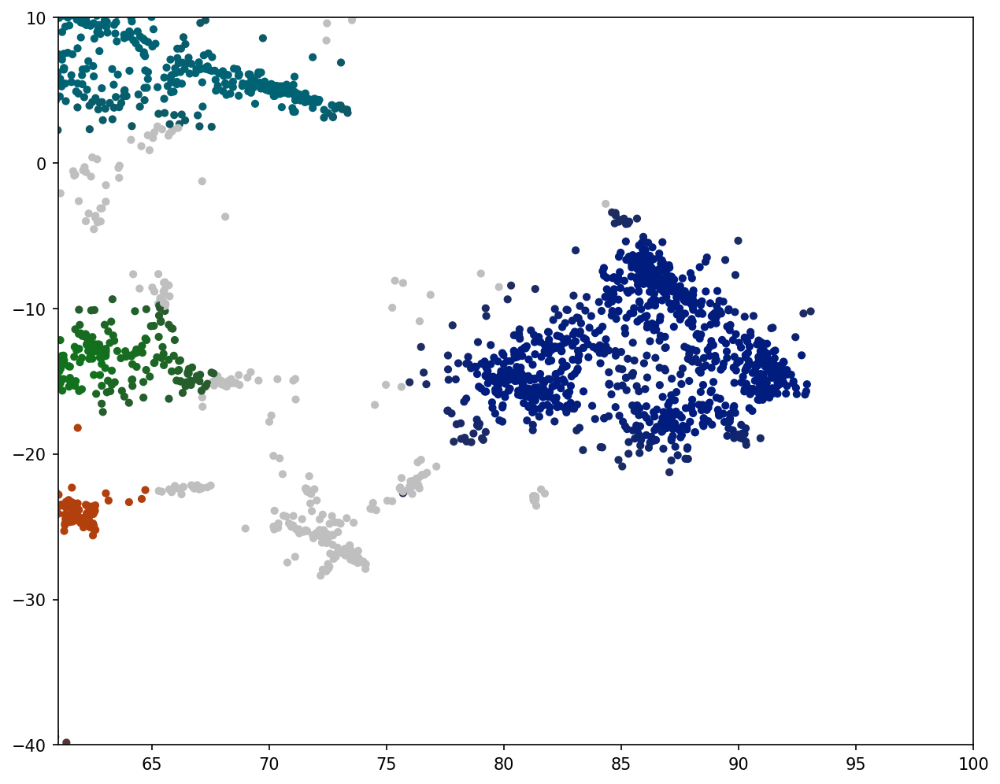

In [81]:
%matplotlib inline

labels, probs, centers = cluster_by_hdbscan(points, hdbscan_params_by_level[3.2])
colors = get_point_colors(labels, probs, palette_name='dark')
plt.figure(figsize=(10, 8), dpi=150)  
plt.scatter(points[:,0], points[:,1],  c=colors, **plot_kwds)

# add helpful statistics
cluster_cnt = len(set(labels)) - (-1 in labels)
noise_cnt = sum(labels == -1)

# plt.text(
#     0.05, 
#     0.95, 
#     f"points={len(labels)}\ncluster_cnt={cluster_cnt}\nnoise_cnt={noise_cnt}\n",
#     fontsize=8,
#     verticalalignment='top',
#     transform=plt.gca().transAxes,
# )

# for _, center in centers.iterrows():
#     plt.scatter(center['x'], center['y'], c='black', marker='x', s=1, linewidths=5)

# Set the figure size and resolution


plt.xlim(61, 100)
plt.ylim(-40, 10)

plt.show()

IndexError: index 6 is out of bounds for axis 0 with size 6

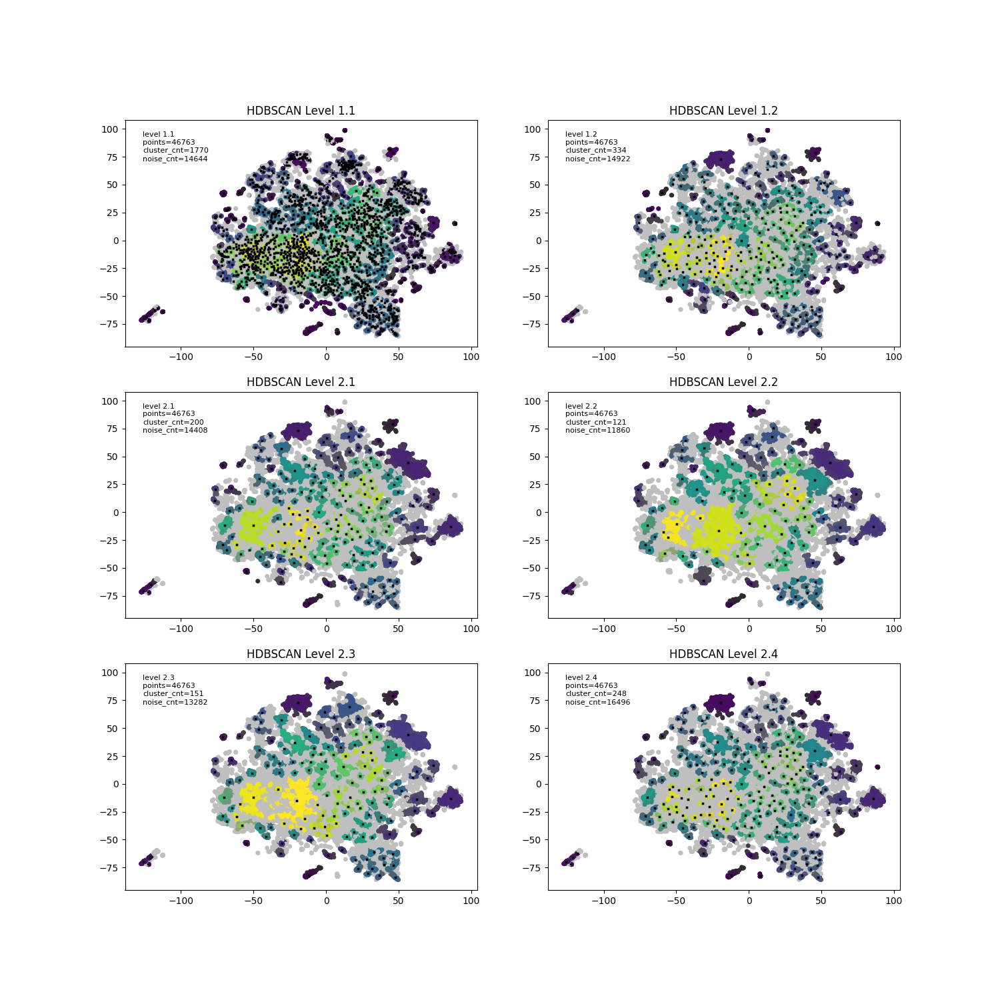

In [69]:
# Create subplots
%matplotlib widget
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()

for i, (level, params) in enumerate(hdbscan_params_by_level.items()):
    labels, probs, centers = cluster_by_hdbscan(points, params)
    colors = get_point_colors(labels, probs)    
    axes[i].scatter(points[:, 0], points[:, 1], c=colors, **plot_kwds)
    
    # Add helpful statistics
    cluster_cnt = len(set(labels)) - (-1 in labels)
    noise_cnt = sum(labels == -1)
    axes[i].text(
        0.05, 
        0.95, 
        f"level {level}\npoints={len(labels)}\ncluster_cnt={cluster_cnt}\nnoise_cnt={noise_cnt}\n",
        fontsize=8,
        verticalalignment='top',
        transform=axes[i].transAxes,
    )

    for _, center in centers.iterrows():
        axes[i].scatter(center['x'], center['y'], c='black', marker='x', s=1, linewidths=3)
    
    axes[i].set_title(f'HDBSCAN Level {level}')

# Adjust layout
plt.tight_layout()
plt.show()

# Topic Modeling
**Purpose**: Given cluster labels and the metadata of each point, discover the topics/themes that represent each of the clusters.

We use **MeSH Terms** in the POC as the vocabulary to represent the topic of each cluster.
- MeSH is a controlled vocabulary thesaurus produced by the National Library of Medicine (NLM) 
- The NLM is responsible for updating and maintaining the MeSH vocabulary on an annual basis, adding new terms, removing outdated ones, and reorganizing the hierarchical structure as needed
- Prior to April 2022, most MEDLINE records were indexed with MeSH terms by human indexers at the NLM. Since then, an automated indexing process is used initially, with human quality checks on selected sets of citations

**Implementation Options**
- Frequency of MeSH Terms (w/ filteration of general/high level MeSH terms like 'human', 'man')
- TF-IDF (Term Frequency-Inverse Document Frequency)
- Latent Dirichlet Allocation (LDA)
- Non-negative Matrix Factorization (NMF)

## Frequency of MeSH Terms

In [36]:
def get_cluster_topics_by_frequency(
        labels,
        df,
        filter_terms,
        mesh_fieldname='mesh_terms',
        terms_per_topic: int = 1,
        term_concat_delimiter: str = '; ',
):
    unique_labels = set(labels)  # TODO: use clusterer.labels_.max() instead (increments from 0, may include -1)
    unique_labels.discard(-1)

    cluster_terms = defaultdict(list)
    for index, label in enumerate(labels):
        cluster_terms[label].extend([t for t in df.iloc[index, df.columns.get_loc(mesh_fieldname)].split(';')])

    cluster_topics = {}
    for l in unique_labels:
        term_counter = Counter(cluster_terms[l])
        topic_terms = []
        for t, cnt in term_counter.most_common(20):
            # naive filter
            if t not in filter_terms:
                topic_terms.append(t)
            if len(topic_terms) >= terms_per_topic:
                break
        cluster_topics[l] = term_concat_delimiter.join(topic_terms)
    return cluster_topics

In [8]:
FILTER_TERMS = {'Human', 'Humans', 'Mice', 'Female', 'Male', 'Aged', 'Middle Aged', 'Animals', 'Adult', ''}

labels, probs, centers = cluster_by_hdbscan(points, hdbscan_params_by_level[3.1])
cluster_topics = get_cluster_topics_by_frequency(labels, points_df, FILTER_TERMS)

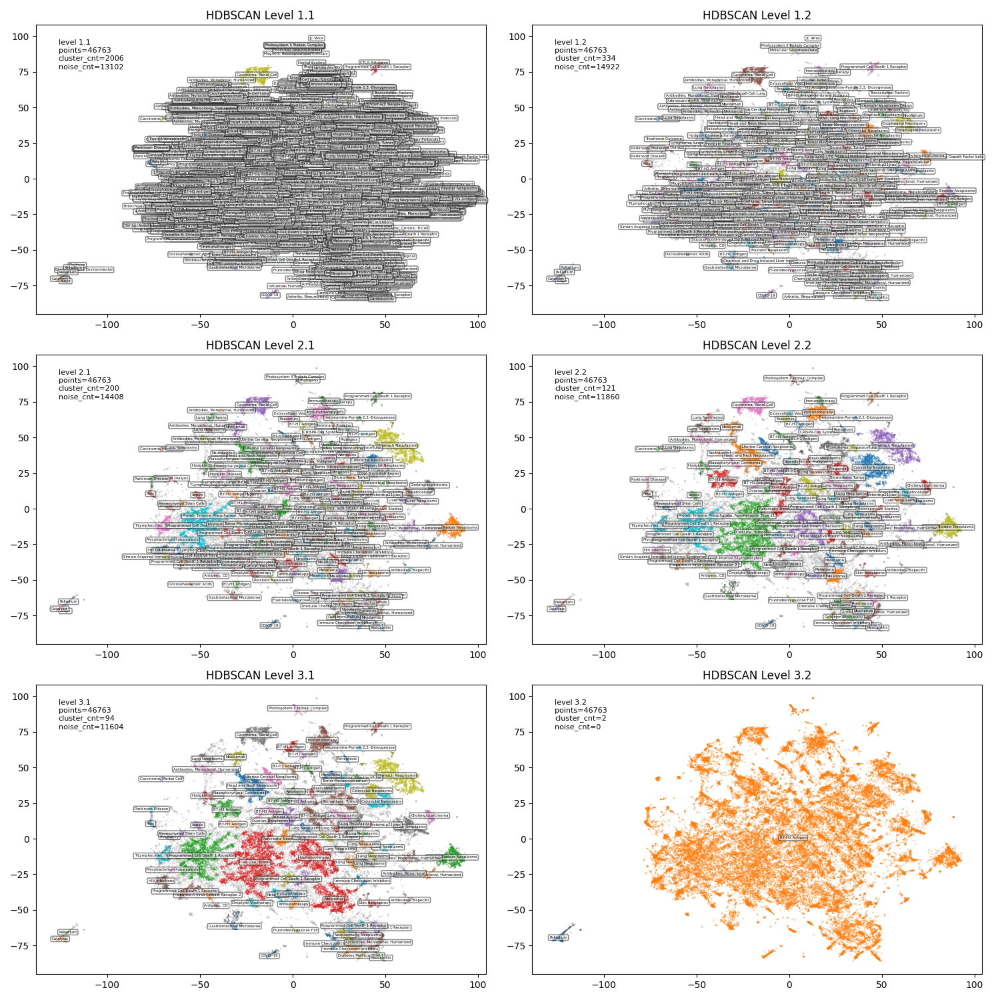

In [9]:
# Demo
%matplotlib widget

topic_annotation_kwds = {
    'fontsize': 4,
    'color': 'black', 
    'ha':'center', 
    'va':'center', 
    'bbox':dict(facecolor='white', edgecolor='black', boxstyle='round',alpha=0.5),
}

fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()

for i, (level, params) in enumerate(hdbscan_params_by_level.items()):
    labels, probs, centers = cluster_by_hdbscan(points, params)
    colors = get_point_colors(labels, probs)    
    axes[i].scatter(points[:, 0], points[:, 1], c=colors, **plot_kwds)
    
    # Add helpful statistics
    cluster_cnt = len(set(labels)) - (-1 in labels)
    noise_cnt = sum(labels == -1)
    axes[i].text(
        0.05, 
        0.95, 
        f"level {level}\npoints={len(labels)}\ncluster_cnt={cluster_cnt}\nnoise_cnt={noise_cnt}\n",
        fontsize=8,
        verticalalignment='top',
        transform=axes[i].transAxes,
    )

    cluster_topics = get_cluster_topics_by_frequency(labels, points_df, FILTER_TERMS)

    for _, center in centers.iterrows():        
        axes[i].text(center['x'], center['y'], cluster_topics.get(center['labels'], 'N/A'), **topic_annotation_kwds)
    
    axes[i].set_title(f'HDBSCAN Level {level}')

# Adjust layout
plt.tight_layout()
plt.show()

In [40]:
# def get_cluster_topics_by_weighted_frequency(labels, probabilities, df, filter_terms, mesh_fieldname='mesh_terms'):
#     cluster_terms = defaultdict(float)
#     for index, (label, probability) in enumerate(zip(labels, probabilities)):
#         for t in df.iloc[index, df.columns.get_loc(mesh_fieldname)].split(';'):
#             cluster_terms[t] += probability

#     # sort cluster_terms keys by max -> min value


#     unique_labels = set(labels)
#     unique_labels.discard(-1)

#     # cluster_topics = {}
#     # for l in unique_labels:
#     #     term_counter = Counter(cluster_terms[l])
#     #     for t, cnt in term_counter.most_common(20):
#     #         # naive filter
#     #         if t not in filter_terms:
#     #             cluster_topics[l] = t
#     #             break
#     return cluster_topics

# Notes
- In fine-grain clustering, there are several clusters with the same topic annotation located next to each other
- Given that HDBSCAN also outputs probabilities (how likely a point is to belong to a cluster), taking the weighted average (rather than the absolute count of MeSH terms as done above) would likely produce a more representative topic annotation for each cluster

## Term Frequency-Inverse Document Frequency (TF-IDF) Approach
TF-IDF is a statistical measure that evaluates how important a word is to a document in a collection or corpus. It is widely used in information retrieval, text mining, and natural language processing applications.

The TF-IDF score is calculated as the product of two metrics:
- **Term Frequency (TF)**: This measures how frequently a term occurs in a document. Terms that appear many times in a document have a higher TF score.
- **Inverse Document Frequency (IDF)**: This measures how important or rare a term is across the entire document corpus. Terms that appear in many documents have a lower IDF score, while rare terms have a higher IDF score.

TF-IDF is useful in various natural language processing tasks, including:
- Information Retrieval: Search engines use TF-IDF to rank the relevance of documents for a given query.
- Text Classification: TF-IDF can be used to convert text into numerical vectors, which can then be used as input for machine learning models for text classification tasks.
- Text Summarization: TF-IDF can help identify the most important terms or sentences in a document, which can be used for automatic text summarization.
- Topic Modeling: TF-IDF can be used as a preprocessing step for topic modeling algorithms like Latent Dirichlet Allocation (LDA) or Non-negative Matrix Factorization (NMF).

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
from typing import Dict, List, Set

def custom_tokenizer(text: str) -> List[str]:
    return text.split(';')

def get_cluster_topics_by_tfidf(
        labels: List[int], 
        df: pd.DataFrame,
        filter_terms: Set[str] = set(),
        mesh_fieldname: str = 'mesh_terms',
        terms_per_topic: int = 1,
        term_concat_delimiter: str = '; ',
) -> Dict[int, str]:
    cluster_terms = defaultdict(list)
    for label, terms in zip(labels, df[mesh_fieldname]):
        if label != -1:
            cluster_terms[label].append(terms)

    documents = [';'.join(terms) for terms in cluster_terms.values()]

    vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, lowercase=False)
    tfidf_matrix = vectorizer.fit_transform(documents)
    feature_names = vectorizer.get_feature_names_out()
    original_terms = {v: k for k, v in vectorizer.vocabulary_.items()}

    cluster_topics = {}
    for label, scores in zip(cluster_terms.keys(), tfidf_matrix.toarray()):
        topic_terms = []
        for idx in scores.argsort()[::-1]:  # Sort indices by score in descending order
            candidate = original_terms[idx]
            if candidate not in filter_terms:
                topic_terms.append(candidate)

            if len(topic_terms) >= terms_per_topic:
                break

        cluster_topics[label] = term_concat_delimiter.join(topic_terms)

    return cluster_topics

labels, probs, centers = cluster_by_hdbscan(points, hdbscan_params_by_level[3.1])

# get_cluster_topics_by_tfidf(labels, points_df, FILTER_TERMS, 'mesh_terms', mesh_per_topics=3)
get_cluster_topics_by_tfidf(labels, points_df, FILTER_TERMS, 'mesh_terms')

/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


{92: 'Mice, Inbred C57BL',
 20: 'Animals, Newborn',
 2: 'Palladium',
 6: 'Photosystem II Protein Complex',
 93: 'Cell Line, Tumor',
 60: 'Squamous Cell Carcinoma of Head and Neck',
 19: 'Parkinson Disease',
 31: 'Thyroid Diseases',
 3: 'Polymorphism, Single Nucleotide',
 10: 'Gastrointestinal Microbiome',
 89: 'Neoplasms',
 50: 'Brain Neoplasms',
 25: 'Nanoparticles',
 1: 'Catalysis',
 44: 'Mesenchymal Stem Cells',
 12: 'Urinary Bladder Neoplasms',
 18: 'Stomach Neoplasms',
 14: 'Antibodies, Monoclonal',
 85: 'Biomarkers, Tumor',
 37: 'Pregnancy',
 55: 'HIV Infections',
 69: 'T-Lymphocytes, Helper-Inducer',
 42: 'Lymphoma, Large B-Cell, Diffuse',
 7: 'Carcinoma, Renal Cell',
 64: 'B7-H1 Antigen',
 83: 'Hepatitis B, Chronic',
 91: 'Immunotherapy',
 53: 'Melanoma',
 24: 'Biosensing Techniques',
 41: 'Leukemia, Myeloid, Acute',
 51: 'Hepatitis A Virus Cellular Receptor 2',
 70: 'Lung Neoplasms',
 43: 'Hodgkin Disease',
 65: 'Ovarian Neoplasms',
 30: 'Colitis',
 71: 'Pancreatic Neoplasms',

/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


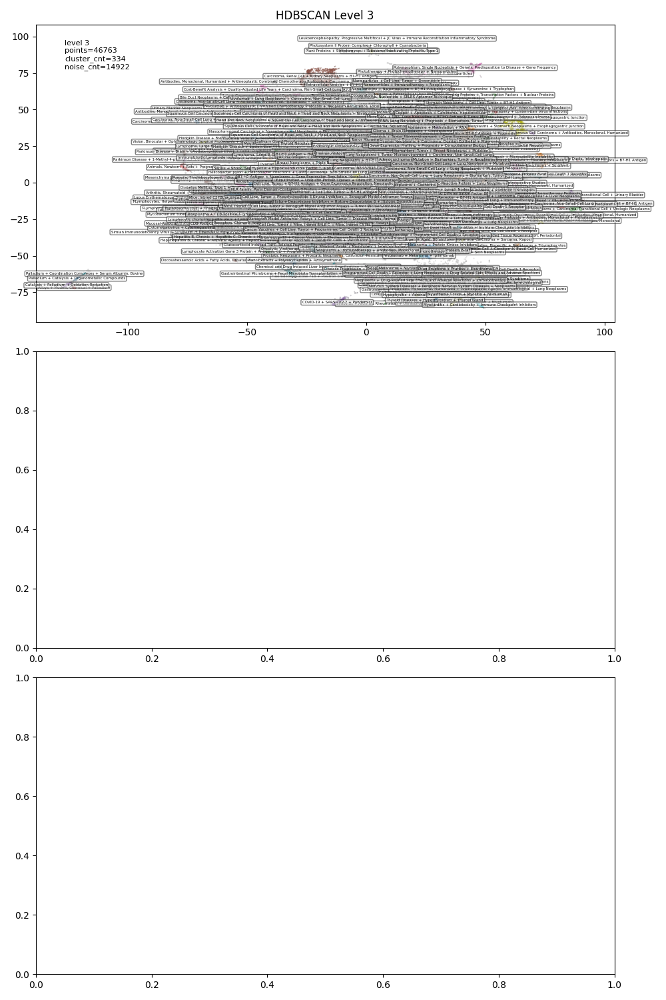

In [53]:
# Demo
%matplotlib widget

params_by_level = {
    1: {
        'hdbscan_params': {'min_cluster_size':150, 'min_samples':30},
        'labeling_params': {'terms_per_topic': 1}
    },
    2: {
        'hdbscan_params': {'min_cluster_size':40, 'min_samples':20},
        'labeling_params': {'terms_per_topic': 1}
    },
    3: {
        'hdbscan_params': {'min_cluster_size':20, 'min_samples':10},
        'labeling_params': {'terms_per_topic': 3, 'term_concat_delimiter': ' + '}
    },
}

topic_annotation_kwds = {
    'fontsize': 4,
    'color': 'black', 
    'ha':'center', 
    'va':'center', 
    'bbox':dict(facecolor='white', edgecolor='black', boxstyle='round',alpha=0.5),
}

fig, axes = plt.subplots(3, 1, figsize=(10, 15))
axes = axes.flatten()

for i, (level, params) in enumerate(params_by_level.items()):
    labels, probs, centers = cluster_by_hdbscan(points, params['hdbscan_params'])
    colors = get_point_colors(labels, probs)
    axes[i].scatter(points[:, 0], points[:, 1], c=colors, **plot_kwds)
    
    # Add helpful statistics
    cluster_cnt = len(set(labels)) - (-1 in labels)
    noise_cnt = sum(labels == -1)
    axes[i].text(
        0.05, 
        0.95, 
        f"level {level}\npoints={len(labels)}\ncluster_cnt={cluster_cnt}\nnoise_cnt={noise_cnt}\n",
        fontsize=8,
        verticalalignment='top',
        transform=axes[i].transAxes,
    )

    cluster_topics = get_cluster_topics_by_tfidf(labels, points_df, FILTER_TERMS, **params['labeling_params'])

    for _, center in centers.iterrows():        
        axes[i].text(center['x'], center['y'], cluster_topics.get(center['labels'], 'N/A'), **topic_annotation_kwds)
    
    axes[i].set_title(f'HDBSCAN Level {level}')

# Adjust layout
plt.tight_layout()
plt.show()

In [63]:
# MISC CONSTANT

# TODO: later on, make singular schema for tsv/csv files for processing (this map would not be needed)
data_indices = {
    'PD1-46k.tsv': {
        'pid_idx': 0,
        'x_idx': -2,
        'y_idx': -1,
        'mesh_terms_idx': -4,
        'mesh_topics_idx': -3
    },
    'NS-290k.tsv': {
        'pid_idx': 0,
        'x_idx': -4,
        'y_idx': -3,
        'mesh_terms_idx': -6,
        'mesh_topics_idx': -5
    },
    'HCP-438k.tsv': {
        'pid_idx': 0,
        'x_idx': -2,
        'y_idx': -1,
        'mesh_terms_idx': -4,
        'mesh_topics_idx': -3
    },
}

topic_annotation_kwds = {
    'fontsize': 4,
    'color': 'black', 
    'ha':'center', 
    'va':'center', 
    'bbox':dict(facecolor='white', edgecolor='black', boxstyle='round',alpha=0.5),
}

YO LENGTH IS 46763


/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


YO LENGTH IS 46763


/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


YO LENGTH IS 46763


/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


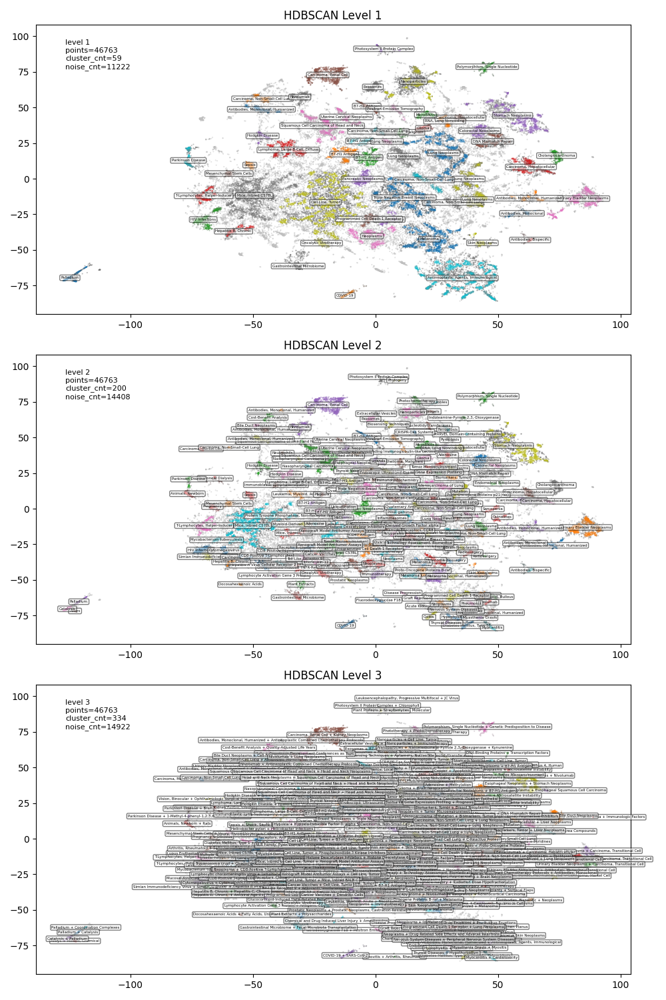

In [75]:
params_by_level = {
    1: {
        'hdbscan_params': {'min_cluster_size':150, 'min_samples':30},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    2: {
        'hdbscan_params': {'min_cluster_size':40, 'min_samples':20},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    3: {
        'hdbscan_params': {'min_cluster_size':20, 'min_samples':10},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 2, 'term_concat_delimiter': ' + '}
    },
}

# ns_params_by_level = {
#     1: {
#         'hdbscan_params': {'min_cluster_size':1000, 'min_samples':1000},
#         'topic_modeling_algorithm': 'tfidf',
#         'labeling_params': {'terms_per_topic': 1}
#     },
#     # 2: {
#     #     'hdbscan_params': {'min_cluster_size':40, 'min_samples':20},
#     #     'topic_modeling_algorithm': 'tfidf',
#     #     'labeling_params': {'terms_per_topic': 1}
#     # },
#     # 3: {
#     #     'hdbscan_params': {'min_cluster_size':20, 'min_samples':10},
#     #     'topic_modeling_algorithm': 'tfidf',
#     #     'labeling_params': {'terms_per_topic': 2, 'term_concat_delimiter': ' + '}
#     # },
# }

def plot_by_topic_levels(filename, params, filter_terms = FILTER_TERMS):
    # todo: unify the data schema, remove following two lines
    indices = data_indices[filename.split('/')[-1]]
    pid_idx, x_idx, y_idx, mesh_terms_idx, mesh_topics_idx = indices['pid_idx'], indices['x_idx'], indices['y_idx'], indices['mesh_terms_idx'], indices['mesh_topics_idx']

    points = load_2d_points(filename, '\t', x_idx, y_idx)
    points_df = get_points_df(filename, '\t', pid_idx, x_idx, y_idx, mesh_terms_idx, mesh_topics_idx)
    
    fig, axes = plt.subplots(3, 1, figsize=(10, 15))
    axes = axes.flatten()

    for i, (level_key, params) in enumerate(params.items()):
        labels, _, centers = cluster_by_hdbscan(points, params['hdbscan_params'])
        colors = get_point_colors(labels, probs)
        axes[i].scatter(points[:, 0], points[:, 1], c=colors, **plot_kwds)
        
        # Add helpful statistics
        cluster_cnt = len(set(labels)) - (-1 in labels)
        noise_cnt = sum(labels == -1)
        axes[i].text(
            0.05, 
            0.95, 
            f"level {level_key}\npoints={len(labels)}\ncluster_cnt={cluster_cnt}\nnoise_cnt={noise_cnt}\n",
            fontsize=8,
            verticalalignment='top',
            transform=axes[i].transAxes,
        )

        cluster_topics = {}
        if params['topic_modeling_algorithm'] == 'tfidf':
            cluster_topics = get_cluster_topics_by_tfidf(labels, points_df, filter_terms, **params['labeling_params'])
        elif params['topic_modeling_algorithm'] == 'frequency':
            cluster_topics = get_cluster_topics_by_frequency(labels, points_df, filter_terms, **params['labeling_params'])
        

        for _, center in centers.iterrows():        
            axes[i].text(center['x'], center['y'], cluster_topics.get(center['labels'], 'N/A'), **topic_annotation_kwds)

        axes[i].set_title(f'HDBSCAN Level {level_key}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

plot_by_topic_levels('./notebooks/testdata/PD1-46k.tsv', params_by_level)
# plot_by_topic_levels('./notebooks/testdata/NS-290k.tsv', ns_params_by_level)

# NOTES

- use clusterer.labels_.max() to find number of clusters
- TOPIC-aware clustering?
- Frequency vs. TF-IDF; considerations
    - polygon tool defaults to frequency
    - next steps for frequency: consider mesh heirarchy & zoom factor together
    - next steps for tf-idf: separate the grid to smaller spaces (100x100, or by bigger clusters) before running the tf-idf algorithm
- Alternative: LLM call to come up with representative topic name
- Consider how to make the topic annotation not intrusive but easy to read (design problem)
    - Color scheme often makes text difficult to read. 
- Try making visibility not strictly on set value thresholds (zoom factor) but a threshold of # of topics visible in screen (e.g. less than 4 topics visible? move down a layer)

# Script to create topic labels given embedding file and clustering/labeling parameters

In [42]:
from collections import defaultdict
import pandas as pd

def _get_topic_level_dict(level_key, meta, labels, centers, points_df, cluster_topics):
    # Filter out noise points and group indices by cluster label
    cluster_point_indices = defaultdict(list)
    for i, label in enumerate(labels):
        if label != -1:
            cluster_point_indices[label].append(i)

    # Generate topics data using a more concise and readable approach
    topics = [
        {
            "name": cluster_topics.get(label, ""),
            "x": float(center['x']),
            "y": float(center['y']),
            "pid_count": len(cluster_pids),
            "pids": cluster_pids
        }
        for label, indices in cluster_point_indices.items()
        if (center := centers.loc[centers['labels'] == label].iloc[0]) is not None
        and (cluster_pids := points_df.iloc[indices]['pid'].tolist()) is not None
    ]

    return {
        "level": level_key,
        "meta": meta,
        "topics": topics
    }


In [57]:
import json
import numpy as np
from collections import defaultdict


def generate_topic_levels(filename, params, filter_terms = FILTER_TERMS):
    # todo: unify the data schema, remove following two lines
    indices = data_indices[filename.split('/')[-1]]
    pid_idx, x_idx, y_idx, mesh_terms_idx, mesh_topics_idx = indices['pid_idx'], indices['x_idx'], indices['y_idx'], indices['mesh_terms_idx'], indices['mesh_topics_idx']

    points = load_2d_points(filename, '\t', x_idx, y_idx)
    points_df = get_points_df(filename, '\t', pid_idx, x_idx, y_idx, mesh_terms_idx, mesh_topics_idx)
    
    levels = []
    for level_key, params in params.items():
        labels, _, centers = cluster_by_hdbscan(points, params['hdbscan_params'])
        
        cluster_topics = {}
        if params['topic_modeling_algorithm'] == 'tfidf':
            cluster_topics = get_cluster_topics_by_tfidf(labels, points_df, filter_terms, **params['labeling_params'])
        elif params['topic_modeling_algorithm'] == 'frequency':
            cluster_topics = get_cluster_topics_by_frequency(labels, points_df, filter_terms, **params['labeling_params'])
        
        level_data = _get_topic_level_dict(level_key, params, labels, centers, points_df, cluster_topics)
        levels.append(level_data)
   
    data = {"levels": levels}

    with open(filename.replace('.tsv', '_topics.json'), 'w') as f:
        json.dump(data, f, indent=2)

    print(f"Generated {filename.replace('.tsv', '_topics.json')}")


In [87]:
# level numbering system may be changed in the future
params_by_level = {
    1: {
        'hdbscan_params': {'min_cluster_size':150, 'min_samples':30},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    2: {
        'hdbscan_params': {'min_cluster_size':40, 'min_samples':20},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    3: {
        'hdbscan_params': {'min_cluster_size':20, 'min_samples':10},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 2, 'term_concat_delimiter': ' + '}
    },
}

NS_params_by_level = {
    1: {
        'hdbscan_params': {'min_cluster_size':1500, 'min_samples':300},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    2: {
        'hdbscan_params': {'min_cluster_size':400, 'min_samples':200},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 1}
    },
    3: {
        'hdbscan_params': {'min_cluster_size':400, 'min_samples':200},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 2, 'term_concat_delimiter': ' + '}
    },
    4: {
        'hdbscan_params': {'min_cluster_size':20, 'min_samples':10},
        'topic_modeling_algorithm': 'tfidf',
        'labeling_params': {'terms_per_topic': 2, 'term_concat_delimiter': ' + '}
    },
}


NS_FILTER_TERMS = FILTER_TERMS.union({'United States'})
# generate_topic_levels('./notebooks/testdata/NS-290k.tsv', NS_params_by_level, filter_terms=NS_FILTER_TERMS)


generate_topic_levels('./notebooks/testdata/HCP-438k.tsv', NS_params_by_level, filter_terms=NS_FILTER_TERMS)

/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
/Users/binchoi/.pyenv/versions/3.10.13/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Generated ./notebooks/testdata/HCP-438k_topics.json
